Context

Groundwater is the water present beneath the Earth's surface in rock and soil pore spaces and in the fractures of rock formations. About 30 percent of all readily available freshwater in the world is groundwater. A unit of rock or an unconsolidated deposit is called an aquifer when it can yield a usable quantity of water. The depth at which soil pore spaces or fractures and voids in rock become completely saturated with water is called the water table. Groundwater is recharged from the surface; it may discharge from the surface naturally at springs and seeps and can form oases or wetlands. Groundwater is also often withdrawn for agricultural, municipal, and industrial use by constructing and operating extraction wells. Additionally, given the growing scarcity and strong demand for water resources, the sustainability of water resource management requires an urgent policy of measures to ensure the rational use of these resources. The heterogeneous properties of groundwater systems are related to the dynamic temporal-spatial patterns that cause great difficulty in quantifying their complex processes, while good regional groundwater level forecasts are completely required for managing water resources to guarantee suitable support of water demands within any area. Water managers and farmers need intelligent groundwater and irrigation planning systems and effective mechanisms to benefit from the scientific and technological revolution, particularly artificial intelligence engines, to enhance water support in their water use planning practices. Furthermore, California has complex water management systems with natural features like mountain snowpack, lakes, rivers, and groundwater basins that are managed with engineered features like reservoirs, levees/flood walls, weirs, culverts, bypasses, and canals. Models represent the complex physical interactions between these features in a conceptual way. Models and other analytical tools help water managers make informed decisions about how best to manage water for people, farms, and the environment as well as to protect lives and properties from flooding.

Dataset

DWR continuous groundwater level measurements contain continuous time-series data from automated recorders at sites operated by the Department of Water Resources. Readings are taken at 15-minute to one-hour intervals. Some of the readings are relayed to the California Data Exchange Center. However, most of the monitoring sites are visited once every month or two, when readings are off-loaded from data recorders, then finalized and published. Wells monitored for this dataset are located within Butte, Colusa, Glenn, Mendocino, Modoc, Sacramento, San Joaquin, Shasta, Siskiyou, Solano, Sutter, Tehama, Yolo, and Yuba Counties. Water-level measurements are the principal source of information about changes in groundwater storage and movement in a basin, and how these are affected by various forms of recharge (e.g., precipitation, seepage from streams, irrigation return) and discharge (e.g., seepage to streams, groundwater pumping). Water-level monitoring involves "continuous" or periodic measurements. Continuous monitoring makes use of automatic water-level sensing and recording instruments that are programmed to make scheduled measurements in wells. This provides a high-resolution record of water-level fluctuations. Resulting hydrographs can accurately identify the effects of various stresses on the aquifer system and provide measurements of maximum and minimum water levels in aquifers. Continuous monitoring may be the best technique to use for monitoring fluctuations in groundwater levels during droughts and other critical periods when hydraulic stresses may change at relatively rapid rates, or when real-time data are needed for making water management decisions see USGS reference. This dataset contains (1,048,576) records and includes about 12 variables necessary for the groundwater level estimation as shown in the table below:

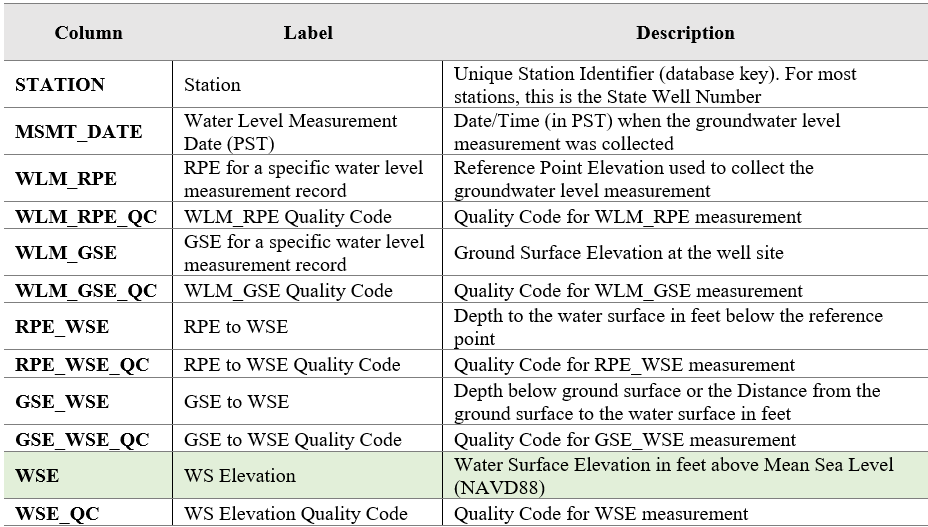

# 1. Load Libraries

In [ ]:
import pandas as pd
import utils
import matplotlib.pyplot as plt
import random
import geopandas as gpd
import contextily as cx
from feature_engine.imputation import RandomSampleImputer
from sklearn.impute import KNNImputer
from statsmodels.tsa.statespace.structural import UnobservedComponents
from statsmodels.tsa.seasonal import STL
from tensorflow.python.keras.layers import Dense
from tensorflow.python.keras import Sequential
from tensorflow.python.keras.losses import MeanSquaredError
from tensorflow.python.keras.optimizers import adam_v2
import tensorflow.python.keras.regularizers as regulate
from tensorflow.python.keras.callbacks import EarlyStopping
import numpy as np
from xgboost import XGBRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder

c:\Users\tomas\miniconda3\envs\ml-env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# 2. Explore Data

#### 2.1 Load Data

In [2]:
data_handle = "alifarahmandfar/continuous-groundwater-level-measurements-2023"
df_daily = utils.load_kaggle_data('gwl-daily.csv',data_handle)
df_monthly = utils.load_kaggle_data('gwl-monthly.csv',data_handle)
quality_codes = utils.load_kaggle_data('gwl-quality_codes.csv',data_handle)
stations_df = utils.load_kaggle_data('gwl-stations.csv',data_handle)

#### 2.2 Spatial Visualization

In [3]:
stations_df.head()

,STATION,SITE_CODE,STNAME,WELL_NAME,LATITUDE,LONGITUDE,LLDATUM,POSACC,ELEV,ELEVDATUM,ELEVACC,COUNTY_NAME,BASIN_CODE,BASIN_NAME,WELL_DEPTH,WELL_USE,WELL_TYPE,WCR_NO,WDL,COMMENT
0,01N04E36Q001M,378861N1214818W001,Middle River Barrier well 2W screen 61-81 ft bgs,MRL-2W,37.886056,-121.481833,NAD83,"Survey, 1m",6.9,NaN,R.L. AT SURFACE,San Joaquin,5-022.15,Tracy,81.0,Observation,Single Well,NaN,https://wdl.water.ca.gov/StationDetails.aspx?S...,01N04E36Q001M is part of a well cluster. Othe...
1,01N04E36Q002M,378849N1214822W001,Middle River Barrier well 3W screen 14-34 ft bgs,MRL-3W,37.884861,-121.482167,NAD83,"Survey, 1m",-1.0,NaN,R.L. AT SURFACE,San Joaquin,5-022.15,Tracy,34.0,Observation,Single Well,NaN,https://wdl.water.ca.gov/StationDetails.aspx?S...,01N04E36Q002M is part of a well cluster. Othe...
2,01N04E36Q003M,378860N1214819W001,Middle River Barrier well 2 screen 10-20 ft bgs,MLNO-2,37.886028,-121.481917,NAD83,"Survey, 1m",8.6,NaN,R.L. AT SURFACE,San Joaquin,5-022.15,Tracy,20.0,Observation,Single Well,NaN,https://wdl.water.ca.gov/StationDetails.aspx?S...,01N04E36Q003M is part of a well cluster. Othe...
3,01N04E36Q004M,378850N1214820W001,Middle River Barrier well 1 screen 10-20 ft bgs,MLNO-1,37.885028,-121.482000,NAD83,"Survey, 1m",15.9,NaN,R.L. AT SURFACE,San Joaquin,5-022.15,Tracy,20.0,Observation,Single Well,NaN,https://wdl.water.ca.gov/StationDetails.aspx?S...,01N04E36Q004M is part of a well cluster. Othe...
4,01S04E28F001M,378186N1215443W001,Grant Line Canal Barrier well 2W screen 10-25 ...,GLWL-2W,37.818556,-121.544333,NAD83,"Survey, 1m",16.1,NaN,R.L. AT SURFACE,San Joaquin,5-022.15,Tracy,25.0,Observation,Single Well,NaN,https://wdl.water.ca.gov/StationDetails.aspx?S...,01S04E28F001M is part of a well cluster. Othe...


In [4]:
def plot_station_map(df):
    # Create GeoDataFrame
    gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.LONGITUDE, df.LATITUDE))
    gdf = gdf.set_crs("EPSG:4326")
    gdf_proj = gdf.to_crs(epsg=3857)

    # Create the plot
    fig, ax = plt.subplots(figsize=(10, 8))

    gdf_proj.plot(ax=ax)

    # Add basemap
    cx.add_basemap(ax, crs=gdf_proj.crs, source=cx.providers.OpenStreetMap.Mapnik)

    # Plot properties
    ax.set_title("Station Map", fontsize=14)
    ax.legend()
    plt.show()

C:\Users\tomas\AppData\Local\Temp\ipykernel_36096\950178599.py:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


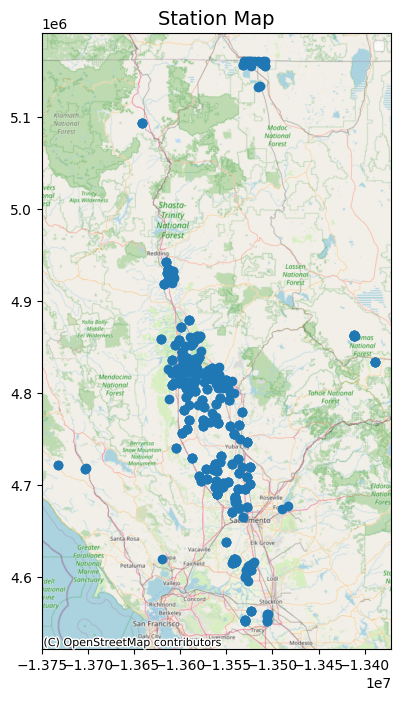

In [5]:
plot_station_map(stations_df)

#### 2.3 Quality Codes

In [6]:
quality_codes

,QUALITY_CODE,DESCRIPTION
0,1,Good data
1,2,Good quality edited data
2,10,Good Measurement
3,15,Provisional measurement
4,20,"Dry, no flow"
5,25,Value may be affected by interference.
6,26,Data imported from historic records.
7,30,Irregular Time Rate Data - weekly/monthly read.
8,35,Estimated data imported from historic records.
9,40,Fair Measurement


#### 2.4 Explore Daily Data

In [7]:
df_daily.head()

,STATION,MSMT_DATE,WLM_RPE,WLM_RPE_QC,WLM_GSE,WLM_GSE_QC,RPE_WSE,RPE_WSE_QC,GSE_WSE,GSE_WSE_QC,WSE,WSE_QC
0,14N01E35P001M,12/27/2022,48.74,1,46.88,1,42.442,2,40.582,2,6.298,2
1,14N01E35P004M,12/27/2022,47.62,1,46.88,1,20.786,2,20.046,2,26.834,2
2,16N03W14H004M,12/27/2022,68.21,1,65.70,1,19.735,2,17.225,2,48.475,2
3,14N01E35P001M,12/26/2022,48.74,1,46.88,1,42.552,2,40.692,2,6.188,2
4,14N01E35P004M,12/26/2022,47.62,1,46.88,1,20.829,2,20.089,2,26.791,2


In [8]:
df_daily.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 12 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   STATION     1048575 non-null  object 
 1   MSMT_DATE   1048575 non-null  object 
 2   WLM_RPE     1042002 non-null  float64
 3   WLM_RPE_QC  1048575 non-null  int64  
 4   WLM_GSE     1039724 non-null  float64
 5   WLM_GSE_QC  1048575 non-null  int64  
 6   RPE_WSE     963223 non-null   float64
 7   RPE_WSE_QC  1048575 non-null  int64  
 8   GSE_WSE     954445 non-null   float64
 9   GSE_WSE_QC  1048575 non-null  int64  
 10  WSE         956650 non-null   float64
 11  WSE_QC      1048575 non-null  int64  
dtypes: float64(5), int64(5), object(2)
memory usage: 96.0+ MB


In [9]:
df_daily.describe()

,WLM_RPE,WLM_RPE_QC,WLM_GSE,WLM_GSE_QC,RPE_WSE,RPE_WSE_QC,GSE_WSE,GSE_WSE_QC,WSE,WSE_QC
count,1.042002e+06,1.048575e+06,1.039724e+06,1.048575e+06,963223.000000,1.048575e+06,954445.000000,1.048575e+06,956650.000000,1.048575e+06
mean,4.991109e+01,1.242263e+01,4.812979e+01,1.217537e+01,21.899209,2.214869e+01,20.253326,3.277009e+01,27.523056,3.239656e+01
std,4.908236e+01,3.096056e+01,4.899384e+01,3.135395e+01,19.311263,6.805131e+01,19.477138,7.157474e+01,49.853360,7.140478e+01
min,-5.700000e-01,1.000000e+00,-3.170000e+00,1.000000e+00,-12.492000,1.000000e+00,-15.292000,1.000000e+00,-170.798000,1.000000e+00
25%,2.645000e+01,1.000000e+00,2.500000e+01,1.000000e+00,9.922000,1.000000e+00,8.360000,1.000000e+00,2.888000,1.000000e+00
50%,3.669200e+01,1.000000e+00,3.554600e+01,1.000000e+00,16.798000,1.000000e+00,15.187000,1.000000e+00,19.063000,1.000000e+00
75%,6.821000e+01,2.000000e+00,6.570000e+01,1.000000e+00,27.683000,1.000000e+00,26.195000,2.000000e+00,48.565000,2.000000e+00
max,5.226500e+02,2.550000e+02,5.200000e+02,2.550000e+02,187.804000,2.550000e+02,186.534000,2.550000e+02,514.804000,2.550000e+02


In [3]:
# How many stations are there?
stations = df_daily.STATION.unique()
num_stations = len(stations)
num_stations

238

In [4]:
# Change date column to datetime
df_daily.MSMT_DATE = pd.to_datetime(df_daily.MSMT_DATE)

In [8]:
# Let's look at some of the station's time series
def plot_station_data(df, cols=['WSE']):
    fig, axs = plt.subplots(4, 4, figsize = (35,35))
    stations = df.STATION.unique()
    i = random.randint(0, 10)
    for rows in axs:
        for ax in rows:
            df[df.STATION==stations[i]].plot(x='MSMT_DATE', y=cols, ax=ax)
            ax.set_title(stations[i])
            i+=random.randint(1, 15)

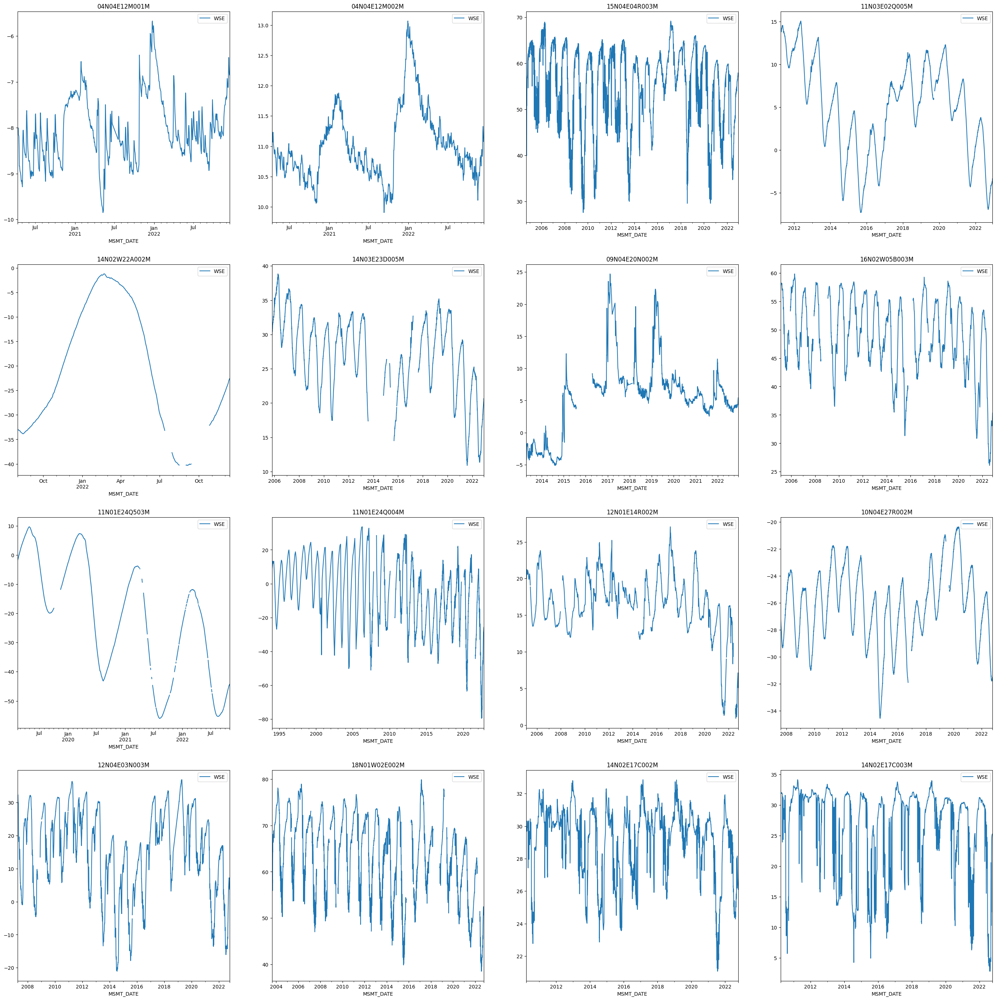

In [13]:
plot_station_data(df_daily)

There is clearly seasonal variation of water level in this dataset. Some wells have more erratic signals which might be unreliable. Note there are some missing values and negative values in the time-series that will have to be dealt with.

In [14]:
df_daily.WSE.isna().sum()

np.int64(91925)

C:\Users\tomas\code\ml-practice\mlpractice\utils\utils.py:224: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  fig.set_xticklabels(fig.get_xticklabels(), rotation=45)


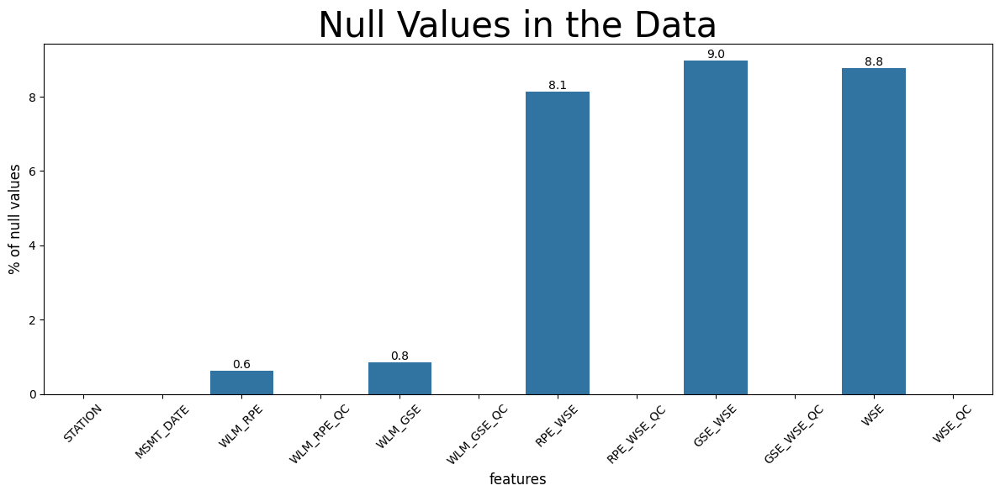

In [15]:
utils.plot_null_values(df_daily)

There are a significant amount of values missing from the RPE_WSE, GSE_WSE, and WSE columns. Let's see if there are stations that are missing all data.

In [5]:
missing_data = df_daily.loc[df_daily.WSE.isnull(),'STATION'].unique()
print(f"{len(missing_data)} stations or {len(missing_data) / num_stations * 100} percent of stations are missing some data")

215 stations or 90.33613445378151 percent of stations are missing some data


In [6]:
# Check which stations are missing all data
all_data_missing = (
    df_daily
    .groupby("STATION")["WSE"]
    .apply(lambda s: s.isnull().all())
)

all_data_missing = all_data_missing[all_data_missing].index.tolist()
all_data_missing

['03N04E11L001M',
 '04N04E10Q001M',
 '04N04E10Q002M',
 '04N04E13A001M',
 '04N04E13A002M',
 '04N04E34N001M',
 '04N04E34N002M']

Let's check the quality codes of the data

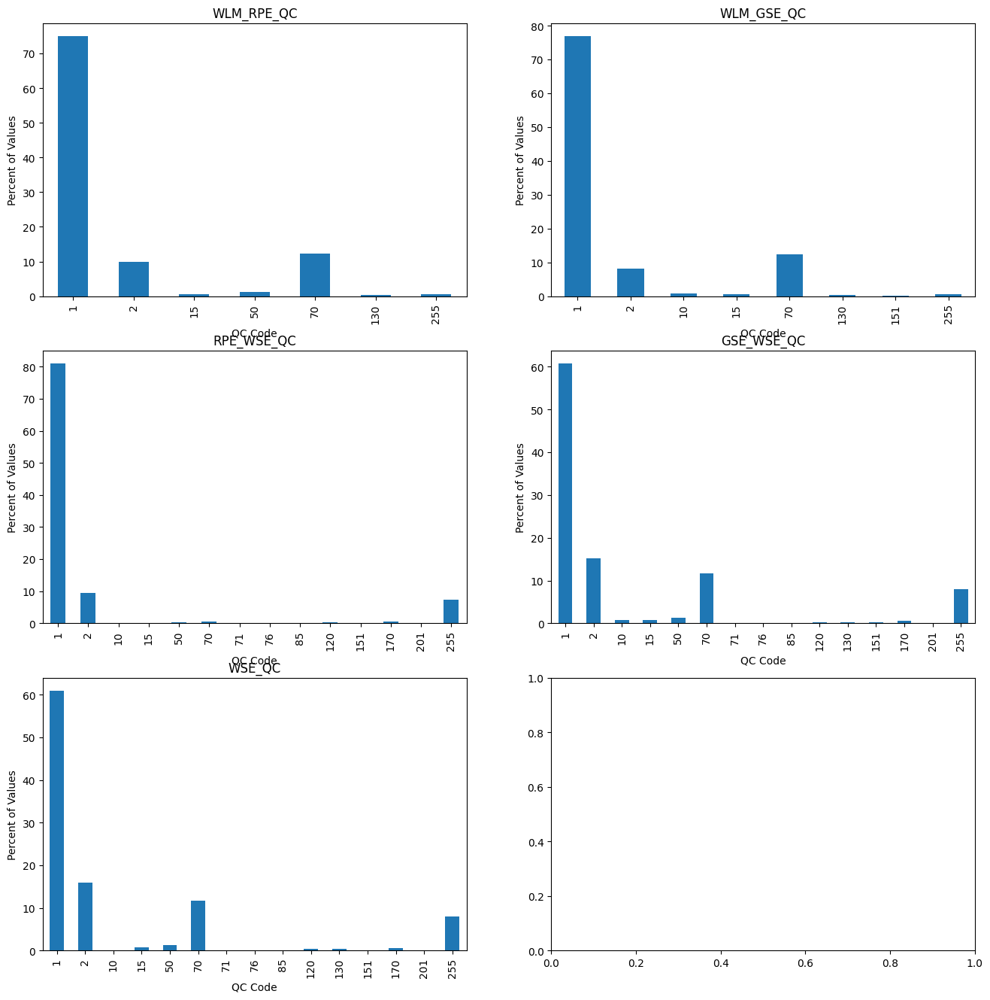

In [18]:
qc_cols = ['WLM_RPE_QC','WLM_GSE_QC','RPE_WSE_QC','GSE_WSE_QC', 'WSE_QC']
fig, axs = plt.subplots(3, 2, figsize = (16,16))

i = 0
for rows in axs:
    for ax in rows:
        if i <len(qc_cols):
            counts = df_daily[qc_cols[i]].value_counts(normalize=True).sort_index() * 100
            counts.plot(kind='bar', ax=ax)
            ax.set_title(f'{qc_cols[i]}')
            ax.set_xlabel('QC Code')
            ax.set_ylabel('Percent of Values')
        i += 1

In [19]:
# Summary of quality codes in dataset
quality_codes[quality_codes.QUALITY_CODE.isin(df_daily.WSE_QC)]

,QUALITY_CODE,DESCRIPTION
0,1,Good data
1,2,Good quality edited data
2,10,Good Measurement
3,15,Provisional measurement
10,50,Unknown Measurement Quality
14,70,Estimated Data
15,71,Manual reading
19,76,Reliable interpolation
25,85,Flooded
28,120,Poor Measurement


#### 2.5 Monthly Data

In [20]:
df_monthly.head()

,STATION,MSMT_DATE,WLM_RPE,WLM_RPE_QC,WLM_GSE,WLM_GSE_QC,RPE_WSE,RPE_WSE_QC,GSE_WSE,GSE_WSE_QC,WSE,WSE_QC
0,03N04E11L001M,12/1/2022,NaN,255,NaN,255,NaN,255,NaN,255,NaN,255
1,04N04E01N001M,12/1/2022,0.00,1,0.00,1,NaN,255,NaN,255,NaN,255
2,04N04E02B001M,12/1/2022,10.73,1,9.63,1,NaN,255,NaN,255,NaN,255
3,04N04E10Q001M,12/1/2022,NaN,255,NaN,255,NaN,255,NaN,255,NaN,255
4,04N04E10Q002M,12/1/2022,NaN,255,NaN,255,NaN,255,NaN,255,NaN,255


In [21]:
df_monthly.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81066 entries, 0 to 81065
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   STATION     81066 non-null  object 
 1   MSMT_DATE   81066 non-null  object 
 2   WLM_RPE     80843 non-null  float64
 3   WLM_RPE_QC  81066 non-null  int64  
 4   WLM_GSE     80500 non-null  float64
 5   WLM_GSE_QC  81066 non-null  int64  
 6   RPE_WSE     65944 non-null  float64
 7   RPE_WSE_QC  81066 non-null  int64  
 8   GSE_WSE     65436 non-null  float64
 9   GSE_WSE_QC  81066 non-null  int64  
 10  WSE         65735 non-null  float64
 11  WSE_QC      81066 non-null  int64  
dtypes: float64(5), int64(5), object(2)
memory usage: 7.4+ MB


We can see this data is missing values as well based on the lower count in the WSE columns.

In [22]:
df_monthly.describe()

,WLM_RPE,WLM_RPE_QC,WLM_GSE,WLM_GSE_QC,RPE_WSE,RPE_WSE_QC,GSE_WSE,GSE_WSE_QC,WSE,WSE_QC
count,80843.000000,81066.000000,80500.000000,81066.000000,65944.000000,81066.000000,65436.000000,81066.000000,65735.000000,81066.000000
mean,342.065483,9.204463,341.046282,9.463314,36.269621,47.636210,34.490961,55.005613,301.250402,54.427787
std,973.933330,27.470877,975.831024,28.758861,33.236157,96.791299,33.380057,96.970646,981.717670,96.861499
min,-0.570000,1.000000,-3.170000,1.000000,-11.949000,1.000000,-14.749000,1.000000,-165.659000,1.000000
25%,45.010000,1.000000,44.580000,1.000000,12.892000,1.000000,11.349750,1.000000,20.651000,1.000000
50%,132.450000,1.000000,129.300000,1.000000,25.996500,1.000000,24.198000,1.000000,95.306000,1.000000
75%,210.080000,1.000000,212.410000,1.000000,49.317000,1.000000,47.699000,70.000000,148.613000,70.000000
max,5495.260000,255.000000,5492.010000,255.000000,299.130000,255.000000,297.010000,255.000000,5491.840000,255.000000


In [7]:
# How many stations are there in this set?
stations_monthly = df_monthly.STATION.unique()
num_monthly_stations = len(stations_monthly)
num_monthly_stations

526

In [8]:
# Change date column to datetime
df_monthly.MSMT_DATE = pd.to_datetime(df_monthly.MSMT_DATE)

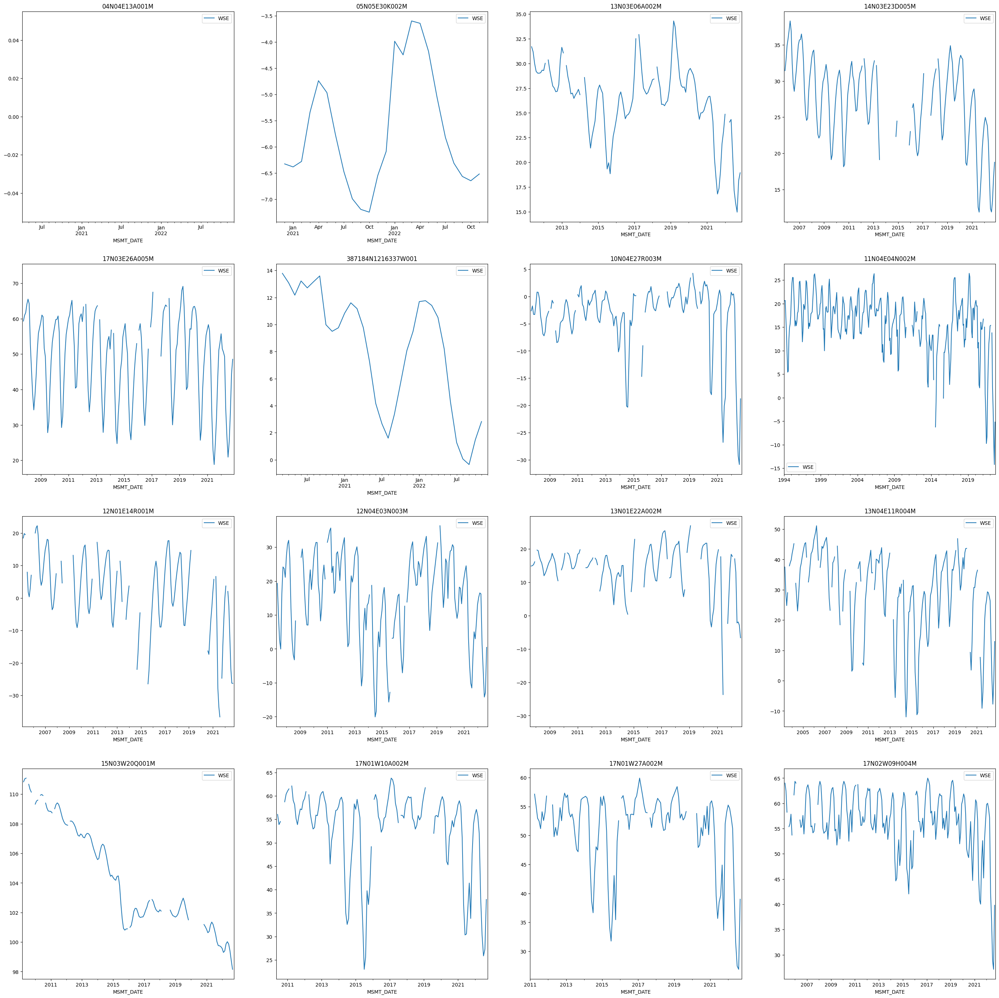

In [ ]:
# Let's look at some of the station's time series
plot_station_data(df_monthly)

There is also a missing data issue with the monthly dataset. Let's take a closer look at that.

C:\Users\tomas\code\ml-practice\mlpractice\utils\utils.py:224: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  fig.set_xticklabels(fig.get_xticklabels(), rotation=45)


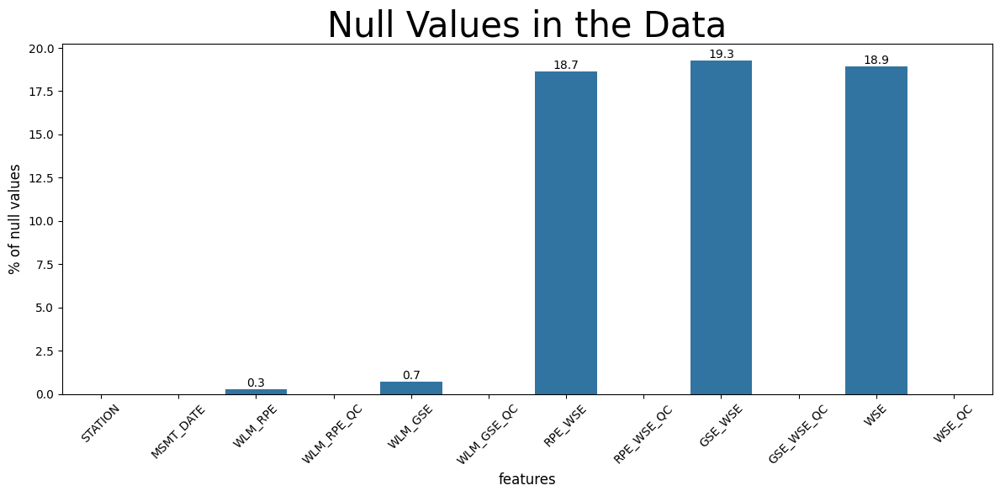

In [ ]:
utils.plot_null_values(df_monthly)

It looks like there are a higher percentage of nulls in this data than the daily data.

In [9]:
missing_monthly_data = df_monthly.loc[df_monthly.WSE.isnull(),'STATION'].unique()
print(f"{len(missing_monthly_data)} stations or {len(missing_monthly_data) / num_monthly_stations * 100} percent of stations are missing some data")

526 stations or 100.0 percent of stations are missing some data


In [10]:
# Check which stations are missing all data
df_monthly["WSE"] = pd.to_numeric(df_monthly["WSE"], errors="coerce")
all_data_missing_monthly = (
    df_monthly
    .groupby("STATION")["WSE"]
    .apply(lambda s: s.isnull().all())
)

all_data_missing_monthly = all_data_missing_monthly[all_data_missing_monthly].index.tolist()
all_data_missing_monthly

['03N04E11L001M',
 '04N04E10Q001M',
 '04N04E10Q002M',
 '04N04E13A001M',
 '04N04E13A002M',
 '04N04E34N001M',
 '04N04E34N002M',
 '31N04W22P001M',
 '31N04W22P002M',
 '31N04W22P003M',
 '31N04W22P004M']

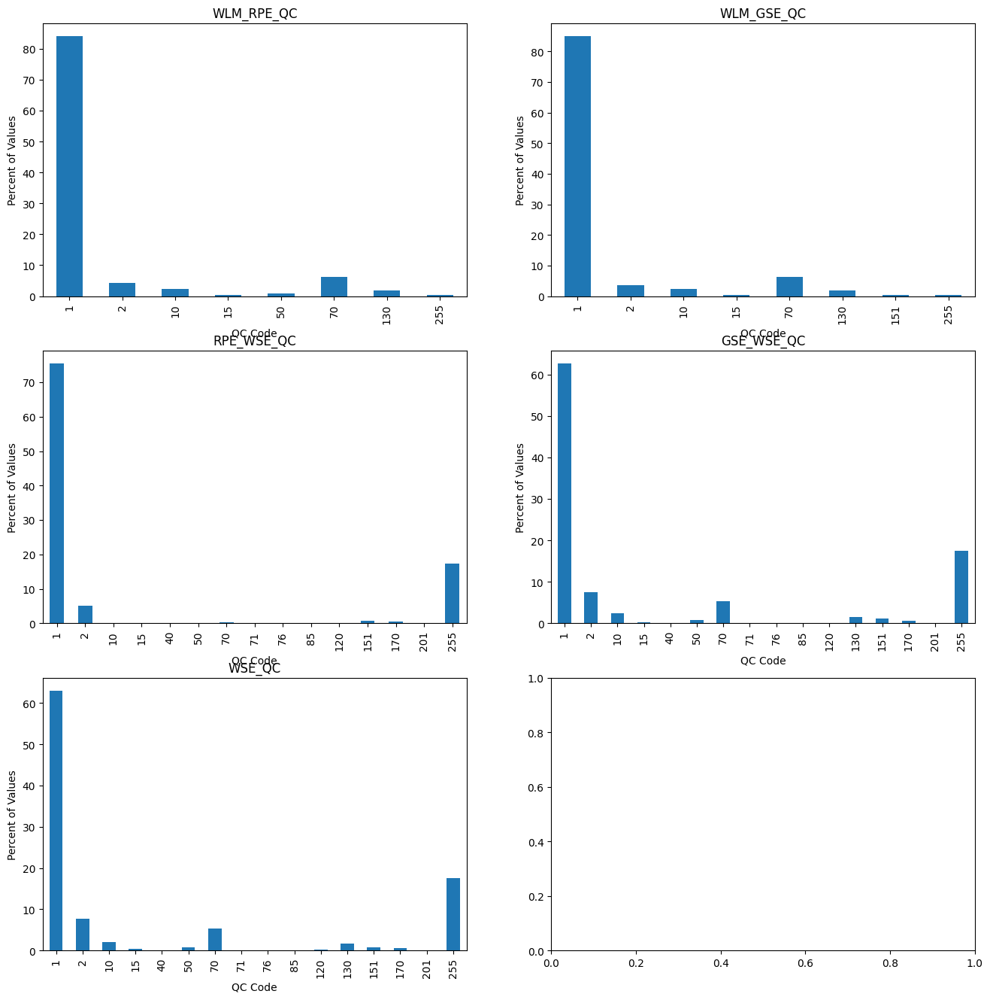

In [28]:
qc_cols = ['WLM_RPE_QC','WLM_GSE_QC','RPE_WSE_QC','GSE_WSE_QC','WSE_QC']
fig, axs = plt.subplots(3, 2, figsize = (16,16))

i = 0
for rows in axs:
    for ax in rows:
        if i <= 4:
            counts = df_monthly[qc_cols[i]].value_counts(normalize=True).sort_index() * 100
            counts.plot(kind='bar', ax=ax)
            ax.set_title(f'{qc_cols[i]}')
            ax.set_xlabel('QC Code')
            ax.set_ylabel('Percent of Values')
        i += 1

In [29]:
# Summary of quality codes in dataset
quality_codes[quality_codes.QUALITY_CODE.isin(df_monthly.GSE_WSE_QC)]

,QUALITY_CODE,DESCRIPTION
0,1,Good data
1,2,Good quality edited data
2,10,Good Measurement
3,15,Provisional measurement
9,40,Fair Measurement
10,50,Unknown Measurement Quality
14,70,Estimated Data
15,71,Manual reading
19,76,Reliable interpolation
25,85,Flooded


Note: 255 did not show up in either the daily or monthly when using this quality code summary. I think 254 in the quality code df is 255 in the data dfs. As a reminder, 254 is rating table exceeded.

# 3. Clean Data

#### 3.1 Missing Values

To deal with stations that are missing all values, we can simply remove them from the dataset. Dealing with multiple missing values within a time series is more complicated, since we would like to have those values for training the ml model. If we remove them, we will be removing some info that could be useful for informing future predictions or spatial interpolation using ml. Linear interopolation may not work well with this dataset, since some time-series are rather variable within short periods. Interpolation with KNN may be the better option for this.

In [11]:
# Remove stations missing all data
df_daily = df_daily.loc[~df_daily.STATION.isin(all_data_missing)]
df_monthly = df_monthly.loc[~df_monthly.STATION.isin(all_data_missing_monthly)]

C:\Users\tomas\code\ml-practice\mlpractice\utils\utils.py:224: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  fig.set_xticklabels(fig.get_xticklabels(), rotation=45)


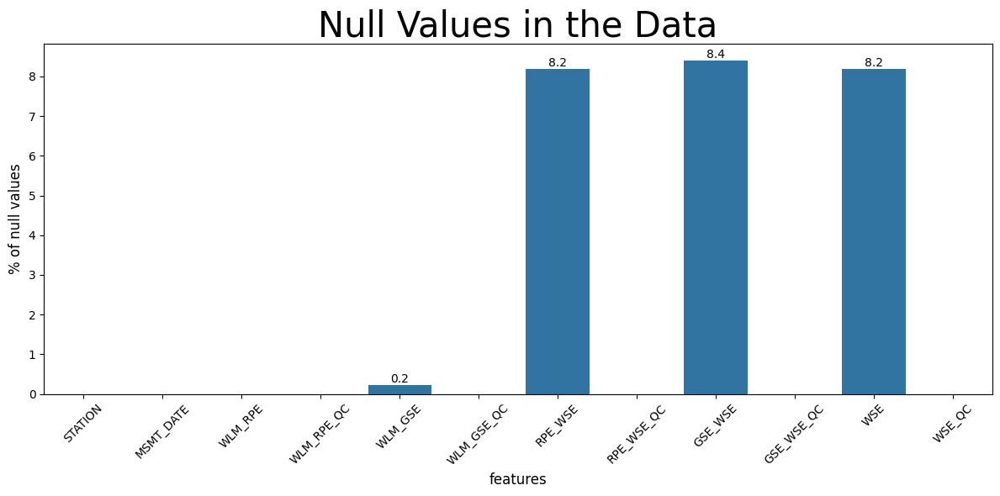

In [14]:
utils.plot_null_values(df_daily)

C:\Users\tomas\code\ml-practice\mlpractice\utils\utils.py:224: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  fig.set_xticklabels(fig.get_xticklabels(), rotation=45)


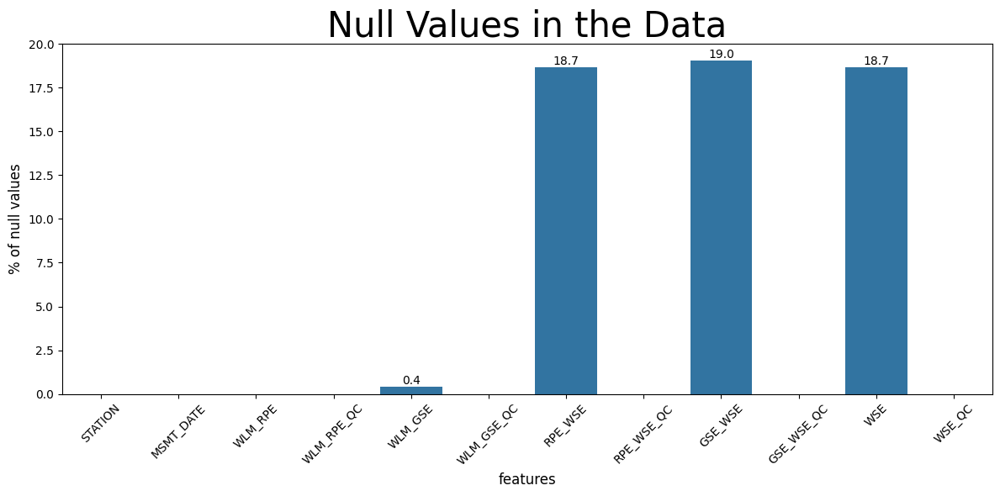

In [32]:
utils.plot_null_values(df_monthly)

Removing the stations with only null values decreased WSE nulls from 8.8% to 8.2% of the daily dataset and 18.9% to 18.7% of the monthly dataset. This gives us a good reason to impute values. Linear interpolation may be a good option before more calculation intensive techniques.

In [16]:
interp_cols = ["WSE", "RPE_WSE", "GSE_WSE"]
df_daily_interp = df_daily.copy()
df_daily_interp[interp_cols] = (
    df_daily_interp.groupby("STATION")[interp_cols]
    .transform(lambda s: s.interpolate(limit_direction="both"))
)

# Verify there are no more null values
df_daily_interp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1042002 entries, 0 to 1048574
Data columns (total 12 columns):
 #   Column      Non-Null Count    Dtype         
---  ------      --------------    -----         
 0   STATION     1042002 non-null  object        
 1   MSMT_DATE   1042002 non-null  datetime64[ns]
 2   WLM_RPE     1042002 non-null  float64       
 3   WLM_RPE_QC  1042002 non-null  int64         
 4   WLM_GSE     1039724 non-null  float64       
 5   WLM_GSE_QC  1042002 non-null  int64         
 6   RPE_WSE     1042002 non-null  float64       
 7   RPE_WSE_QC  1042002 non-null  int64         
 8   GSE_WSE     1039724 non-null  float64       
 9   GSE_WSE_QC  1042002 non-null  int64         
 10  WSE         1042002 non-null  float64       
 11  WSE_QC      1042002 non-null  int64         
dtypes: datetime64[ns](1), float64(5), int64(5), object(1)
memory usage: 103.3+ MB


In [17]:
df_monthly_interp = df_daily.copy()
df_monthly_interp[interp_cols] = (
    df_monthly_interp.groupby("STATION")[interp_cols]
    .transform(lambda s: s.interpolate(limit_direction="both"))
)

# Verify there are no more null values
df_monthly_interp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1042002 entries, 0 to 1048574
Data columns (total 12 columns):
 #   Column      Non-Null Count    Dtype         
---  ------      --------------    -----         
 0   STATION     1042002 non-null  object        
 1   MSMT_DATE   1042002 non-null  datetime64[ns]
 2   WLM_RPE     1042002 non-null  float64       
 3   WLM_RPE_QC  1042002 non-null  int64         
 4   WLM_GSE     1039724 non-null  float64       
 5   WLM_GSE_QC  1042002 non-null  int64         
 6   RPE_WSE     1042002 non-null  float64       
 7   RPE_WSE_QC  1042002 non-null  int64         
 8   GSE_WSE     1039724 non-null  float64       
 9   GSE_WSE_QC  1042002 non-null  int64         
 10  WSE         1042002 non-null  float64       
 11  WSE_QC      1042002 non-null  int64         
dtypes: datetime64[ns](1), float64(5), int64(5), object(1)
memory usage: 103.3+ MB


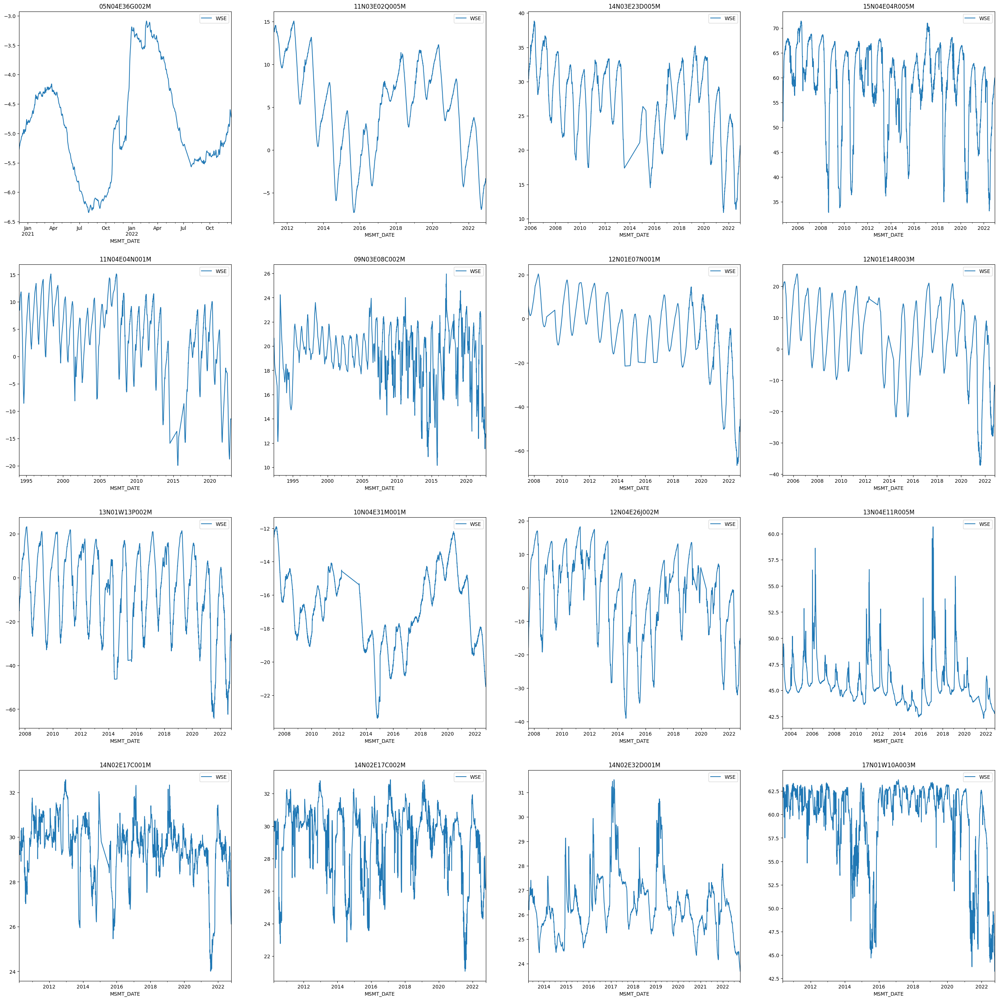

In [ ]:
plot_station_data(df_daily_interp)

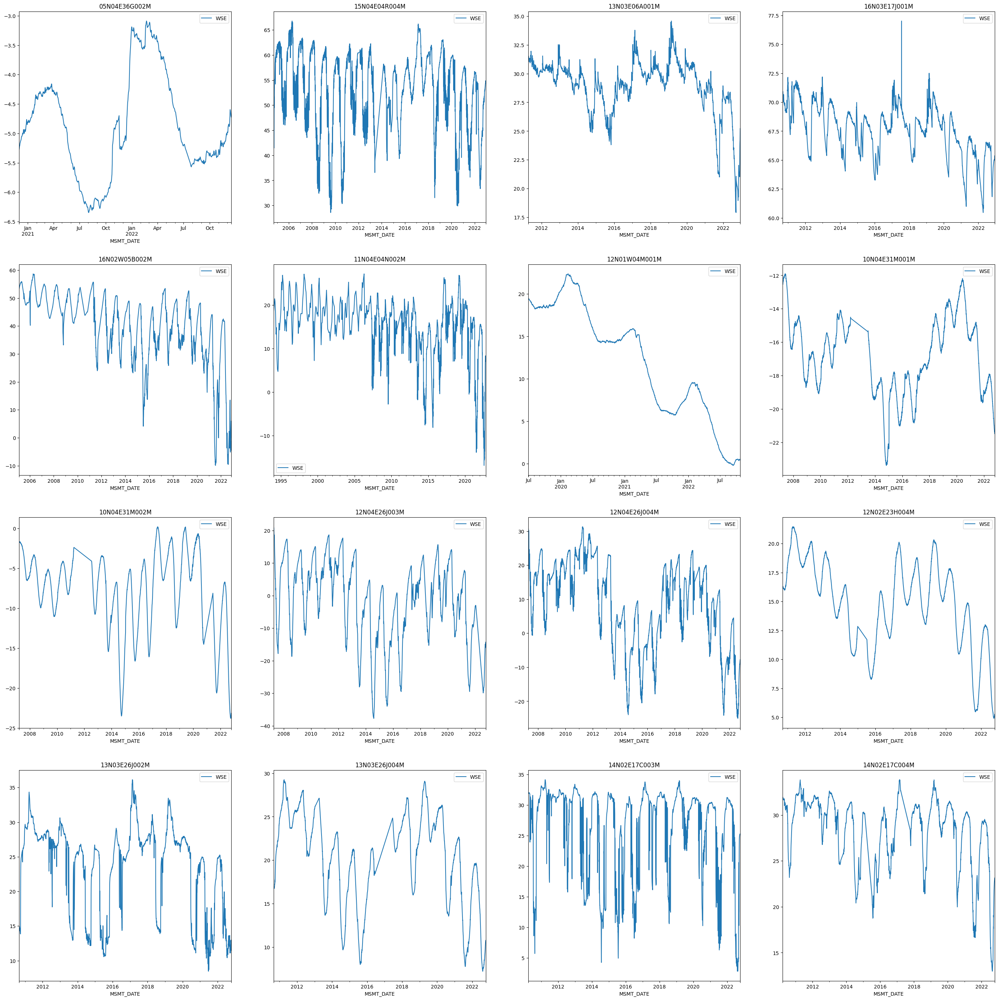

In [ ]:
plot_station_data(df_monthly_interp)

There are some artifacts from linear interp that look completely incorrect, so let's try imputation with KNN next.

In [ ]:
df_daily_knn = df_daily.copy()

imputer = KNNImputer(n_neighbors=4, weights='distance')

df_list = []
for station, g in df_daily_knn.groupby("STATION"):
    g[['WSE']] = imputer.fit_transform(g[['WSE']])
    df_list.append(g)

df_daily_knn = pd.concat(df_list).sort_index()

In [ ]:
df_daily_knn.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1042002 entries, 0 to 1048574
Data columns (total 12 columns):
 #   Column      Non-Null Count    Dtype         
---  ------      --------------    -----         
 0   STATION     1042002 non-null  object        
 1   MSMT_DATE   1042002 non-null  datetime64[ns]
 2   WLM_RPE     1042002 non-null  float64       
 3   WLM_RPE_QC  1042002 non-null  int64         
 4   WLM_GSE     1039724 non-null  float64       
 5   WLM_GSE_QC  1042002 non-null  int64         
 6   RPE_WSE     956650 non-null   float64       
 7   RPE_WSE_QC  1042002 non-null  int64         
 8   GSE_WSE     954445 non-null   float64       
 9   GSE_WSE_QC  1042002 non-null  int64         
 10  WSE         1042002 non-null  float64       
 11  WSE_QC      1042002 non-null  int64         
dtypes: datetime64[ns](1), float64(5), int64(5), object(1)
memory usage: 103.3+ MB


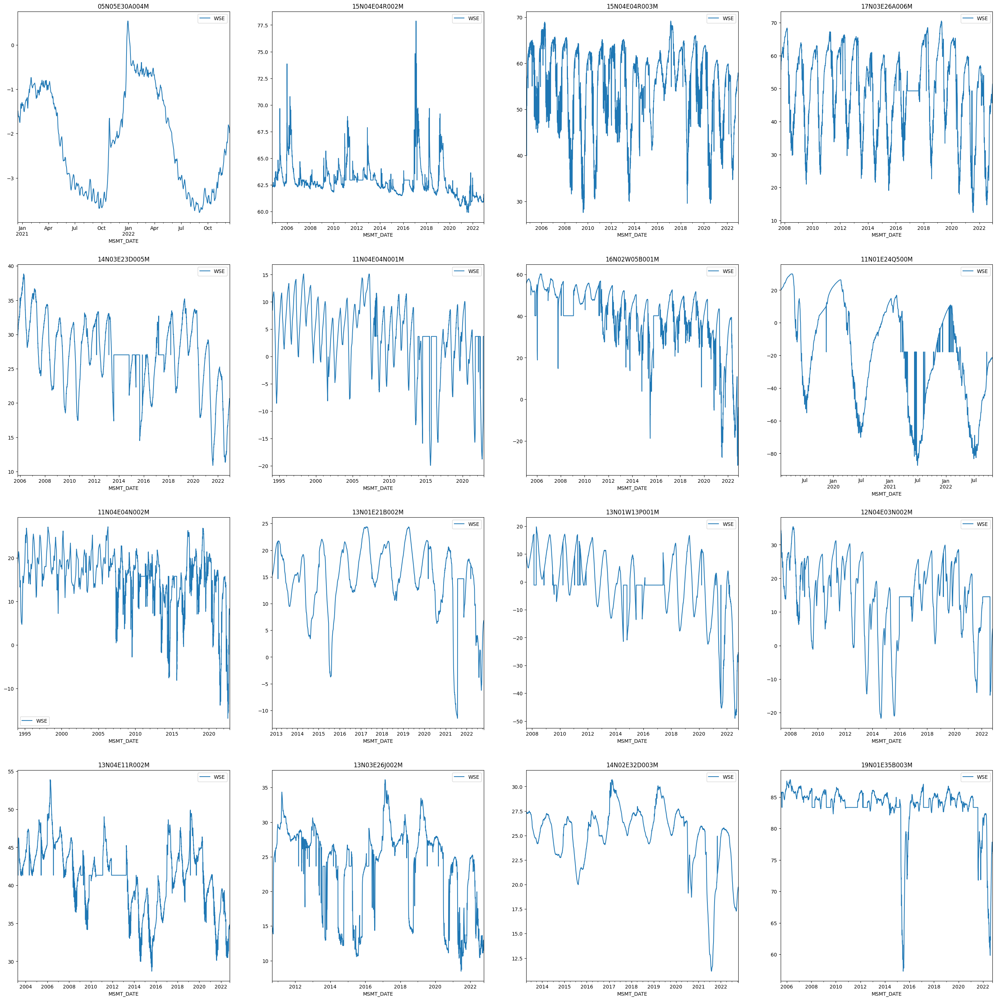

In [ ]:
plot_station_data(df_daily_knn)

It looks like the KNN imputer adds some random spikes in the data, which is definitely not what we want to see. Let's try one other method with a random imputer.

In [ ]:
df_daily_rand = df_daily.copy()

imputer2 = RandomSampleImputer(random_state=42)

df_list = []
for station, g in df_daily_rand.groupby("STATION"):
    g[['WSE']] = imputer2.fit_transform(g[['WSE']])
    df_list.append(g)

df_daily_rand = pd.concat(df_list).sort_index()

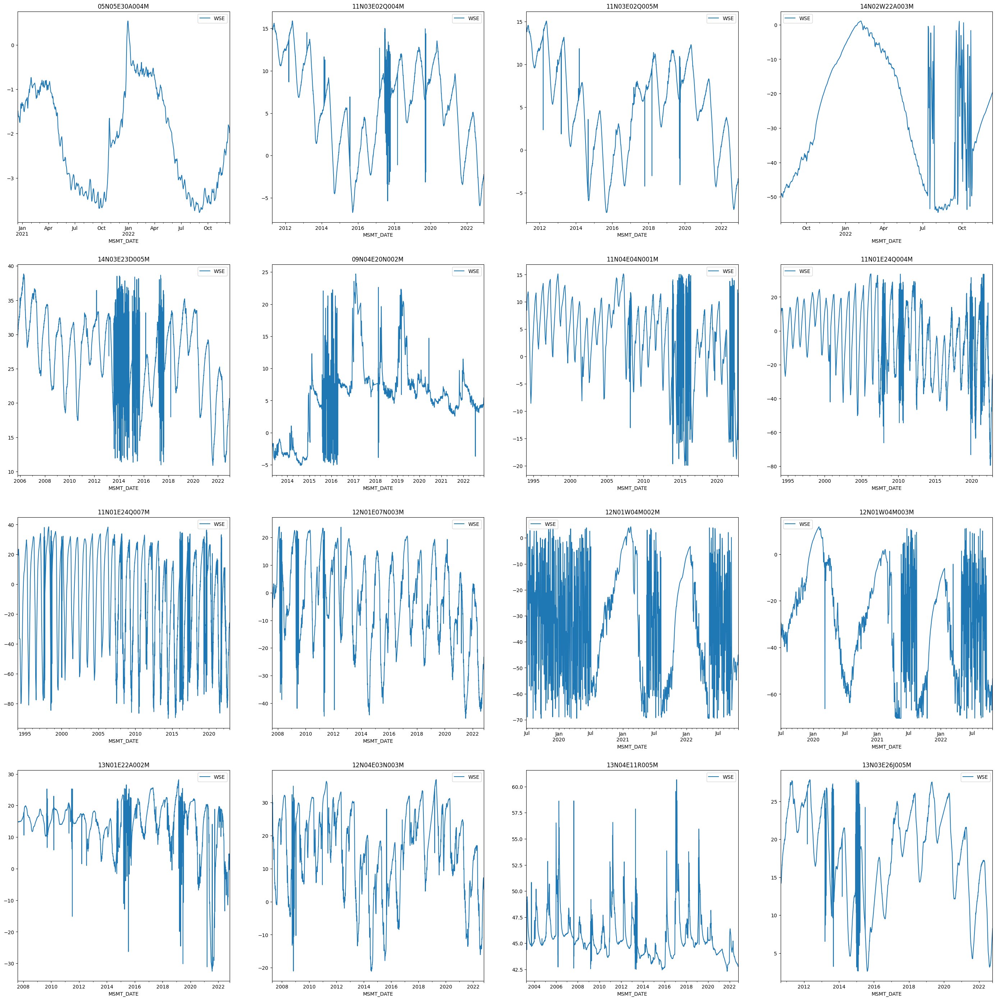

In [ ]:
plot_station_data(df_daily_rand)

These results are also rather spiky in the time-series... Linear intepolation seems to be the best choice for this dataset. However, we can try seasonal, trend, and noise decomposition as the last method.

In [23]:
# Let's try for one timeseries
sample = random.randint(0,len(df_monthly.STATION.unique())-1)
df_test = df_monthly.copy().loc[df_monthly.STATION == df_monthly.STATION.unique()[sample], ['MSMT_DATE','WSE']].sort_values(by='MSMT_DATE').set_index('MSMT_DATE')
y = df_test

mod = UnobservedComponents(
    y,
    level='local level',
    seasonal=13,
)

res = mod.fit()

# stl = STL(df_test, seasonal=3)
# res = stl.fit()
# fig = res.plot()

c:\Users\tomas\miniconda3\envs\ml-env\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\tomas\miniconda3\envs\ml-env\Lib\site-packages\statsmodels\tsa\filters\hp_filter.py:100: SparseEfficiencyWarning: spsolve requires A be CSC or CSR matrix format
  trend = spsolve(I+lamb*K.T.dot(K), x, use_umfpack=use_umfpack)


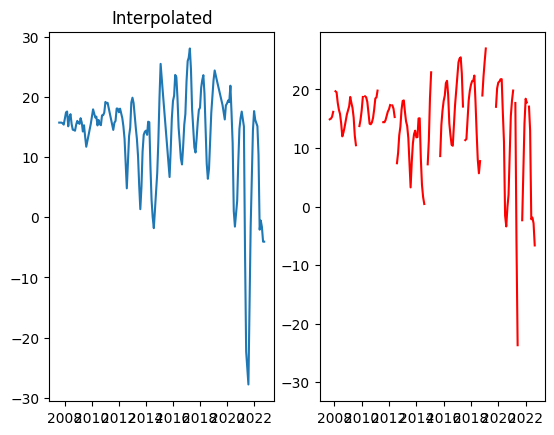

In [24]:
# Filled values (Kalman smoothed)
filled = res.smoothed_state[0]   # the estimated level
df_filled = y.copy()
df_filled = filled

fig, axs = plt.subplots(1,2)

axs[0].plot(df_test.index, df_filled)
axs[0].set_title('Interpolated')
axs[1].plot(df_monthly.loc[df_monthly.STATION == df_monthly.STATION.unique()[sample], ['MSMT_DATE','WSE']].sort_values(by='MSMT_DATE').set_index('MSMT_DATE'), color='r')

This function seems useful, but for stations that have longer periods of missing data it is drawing straight lines to fit or creating data that looks nothing like the original. I think we just remove the data that is causing issues.

In [12]:
remove_qc = [85, 120, 130, 151, 170, 201, 255]
df_daily_qc_removed = df_daily.loc[~df_daily.WSE_QC.isin(remove_qc)]

In [13]:
df_daily_qc_removed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 949936 entries, 0 to 1048574
Data columns (total 12 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   STATION     949936 non-null  object        
 1   MSMT_DATE   949936 non-null  datetime64[ns]
 2   WLM_RPE     949936 non-null  float64       
 3   WLM_RPE_QC  949936 non-null  int64         
 4   WLM_GSE     947731 non-null  float64       
 5   WLM_GSE_QC  949936 non-null  int64         
 6   RPE_WSE     949936 non-null  float64       
 7   RPE_WSE_QC  949936 non-null  int64         
 8   GSE_WSE     947731 non-null  float64       
 9   GSE_WSE_QC  949936 non-null  int64         
 10  WSE         949936 non-null  float64       
 11  WSE_QC      949936 non-null  int64         
dtypes: datetime64[ns](1), float64(5), int64(5), object(1)
memory usage: 94.2+ MB


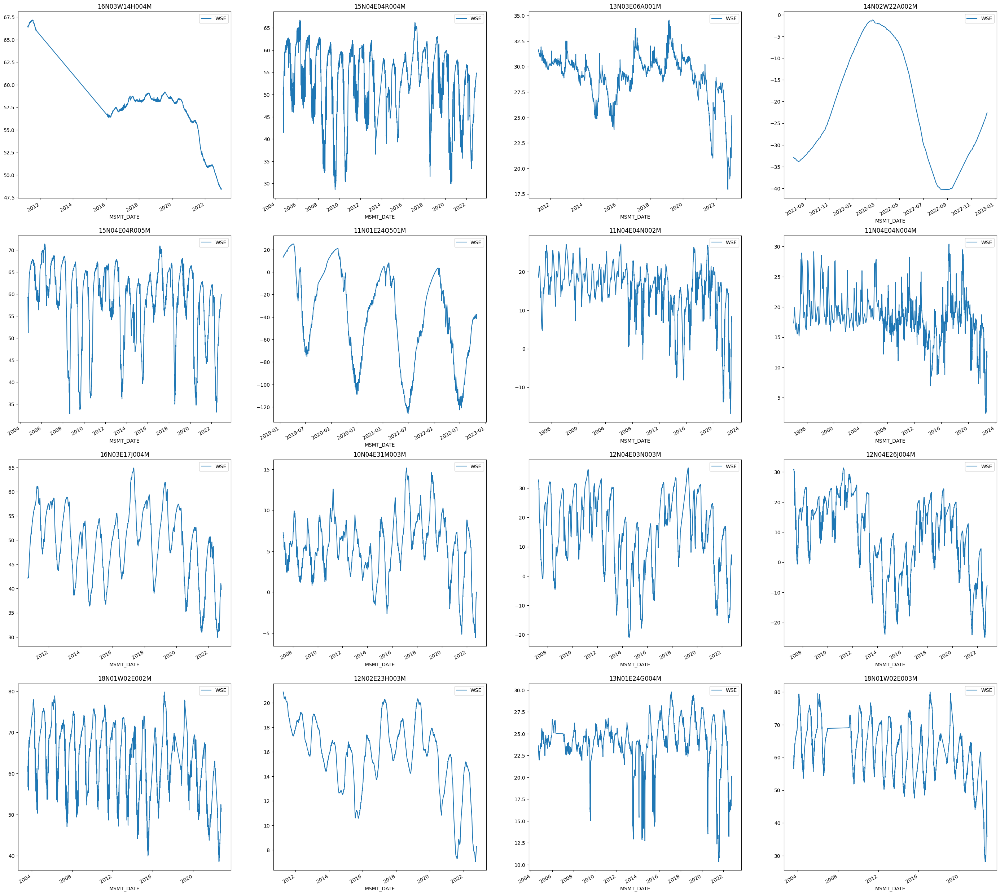

In [20]:
plot_station_data(df_daily_qc_removed)

In [13]:
df_monthly_qc_removed = df_monthly.loc[~df_monthly.WSE_QC.isin(remove_qc)]
df_monthly_qc_removed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 64303 entries, 67 to 81063
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   STATION     64303 non-null  object        
 1   MSMT_DATE   64303 non-null  datetime64[ns]
 2   WLM_RPE     64303 non-null  float64       
 3   WLM_RPE_QC  64303 non-null  int64         
 4   WLM_GSE     64004 non-null  float64       
 5   WLM_GSE_QC  64303 non-null  int64         
 6   RPE_WSE     64303 non-null  float64       
 7   RPE_WSE_QC  64303 non-null  int64         
 8   GSE_WSE     64004 non-null  float64       
 9   GSE_WSE_QC  64303 non-null  int64         
 10  WSE         64303 non-null  float64       
 11  WSE_QC      64303 non-null  int64         
dtypes: datetime64[ns](1), float64(5), int64(5), object(1)
memory usage: 6.4+ MB


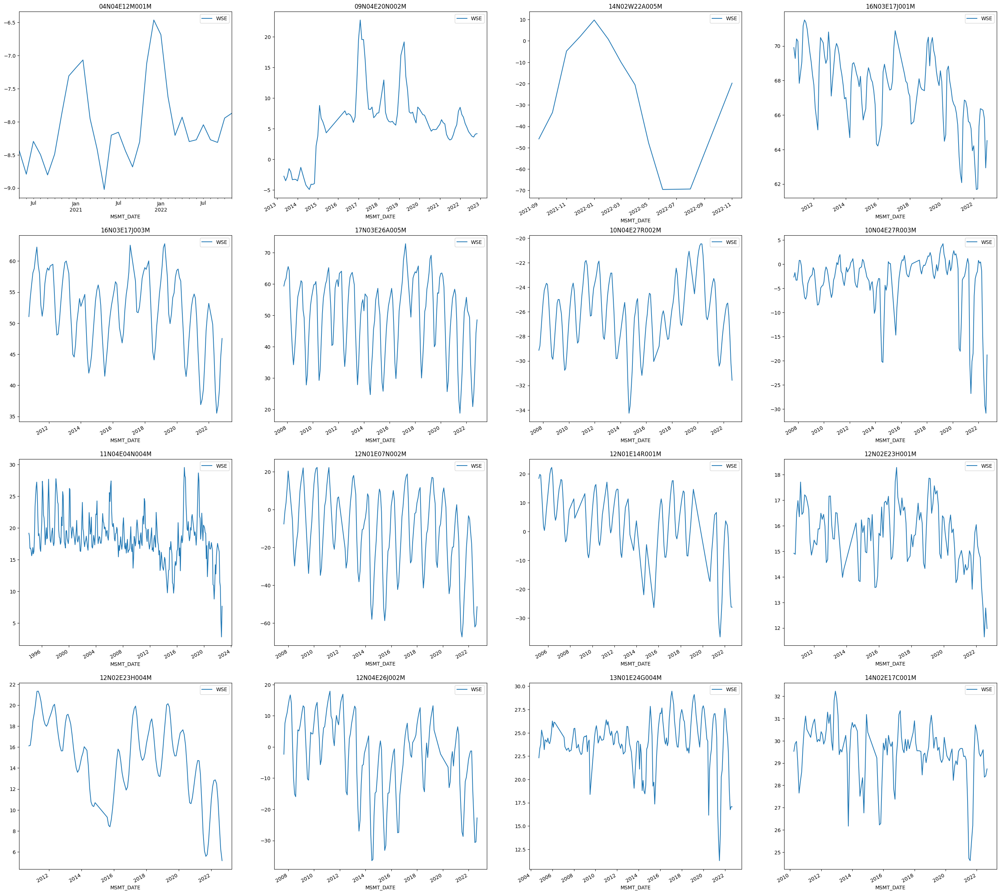

In [28]:
plot_station_data(df_monthly_qc_removed)

While the interpolation methods were worthwhile to explore, it seems like simply removing the bad data in this case is the best course of action for both datasets since the data that is left is enough to train on.

I noticed some data has sudden drops in dash which is ruining the model. Let's remove that data. These can also be used to determine how well the model can perform spatially.

In [14]:
# stations_to_remove = ['01N04E36Q001M','48N04E35C001M','21N01W11A001M', '30N04W25D003M']
# Remove random stations to create an eval set
stations_unique = df_daily_qc_removed['STATION'].unique()
num_spatial_eval = int(len(stations_unique) * 0.1)
eval_stations = np.random.choice(
    stations_unique,
    size=num_spatial_eval,
    replace=False
)

# Will remove these later after the df is set up for training ...
# df_daily_eval = df_daily_qc_removed.copy().loc[~df_daily_qc_removed['STATION'].isin(eval_stations)]
# df_monthly_eval = df_monthly_qc_removed.copy().loc[~df_monthly_qc_removed['STATION'].isin(eval_stations)]

# 4. Train Model

#### 4.1 Define Variables for ML

In [15]:
# Let's combine the daily and monthly datasets for training
df_combined = pd.concat([df_daily_qc_removed, df_monthly_qc_removed], ignore_index=True)
# df_combined = df_monthly_qc_removed

In [18]:
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1014239 entries, 0 to 1014238
Data columns (total 12 columns):
 #   Column      Non-Null Count    Dtype         
---  ------      --------------    -----         
 0   STATION     1014239 non-null  object        
 1   MSMT_DATE   1014239 non-null  datetime64[ns]
 2   WLM_RPE     1014239 non-null  float64       
 3   WLM_RPE_QC  1014239 non-null  int64         
 4   WLM_GSE     1011735 non-null  float64       
 5   WLM_GSE_QC  1014239 non-null  int64         
 6   RPE_WSE     1014239 non-null  float64       
 7   RPE_WSE_QC  1014239 non-null  int64         
 8   GSE_WSE     1011735 non-null  float64       
 9   GSE_WSE_QC  1014239 non-null  int64         
 10  WSE         1014239 non-null  float64       
 11  WSE_QC      1014239 non-null  int64         
dtypes: datetime64[ns](1), float64(5), int64(5), object(1)
memory usage: 92.9+ MB


In [16]:
# Add station location, elevation, and depth to df
add_col = ['STATION', 'ELEV', 'LATITUDE', 'LONGITUDE', 'WELL_DEPTH', 'BASIN_NAME']
df_combined = df_combined.merge(
    stations_df[add_col],
    on='STATION',
    how='left'
)

In [20]:
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1014239 entries, 0 to 1014238
Data columns (total 17 columns):
 #   Column      Non-Null Count    Dtype         
---  ------      --------------    -----         
 0   STATION     1014239 non-null  object        
 1   MSMT_DATE   1014239 non-null  datetime64[ns]
 2   WLM_RPE     1014239 non-null  float64       
 3   WLM_RPE_QC  1014239 non-null  int64         
 4   WLM_GSE     1011735 non-null  float64       
 5   WLM_GSE_QC  1014239 non-null  int64         
 6   RPE_WSE     1014239 non-null  float64       
 7   RPE_WSE_QC  1014239 non-null  int64         
 8   GSE_WSE     1011735 non-null  float64       
 9   GSE_WSE_QC  1014239 non-null  int64         
 10  WSE         1014239 non-null  float64       
 11  WSE_QC      1014239 non-null  int64         
 12  ELEV        1014239 non-null  float64       
 13  LATITUDE    1014239 non-null  float64       
 14  LONGITUDE   1014239 non-null  float64       
 15  WELL_DEPTH  1003922 non-null  fl

In [17]:
from scipy.spatial import KDTree

# Split known and missing well depths
df_known = df_combined.dropna(subset=['WELL_DEPTH'])
df_missing = df_combined[df_combined['WELL_DEPTH'].isna()]

# Build KD-tree using LATITUDE and LONGITUDE
tree = KDTree(df_known[['LATITUDE', 'LONGITUDE']].to_numpy())
k = 3  # number of nearest neighbors

# Find nearest neighbors for each missing well
distances, indices = tree.query(df_missing[['LATITUDE', 'LONGITUDE']].to_numpy(), k=k)

# Compute mean WELL_DEPTH of neighbors
mean_depths = df_known['WELL_DEPTH'].to_numpy()[indices].mean(axis=1)

# Fill missing WELL_DEPTH values
df_combined.loc[df_missing.index, 'WELL_DEPTH'] = mean_depths

In [18]:
# Ensure msmt date is datetime
df_combined['MSMT_DATE'] = pd.to_datetime(df_combined['MSMT_DATE'])

# Change the date to year, month, day
df_combined['year'] = df_combined['MSMT_DATE'].dt.year
df_combined['month'] = df_combined['MSMT_DATE'].dt.month
df_combined['day'] = df_combined['MSMT_DATE'].dt.day

# Account for the cyclical nature of the data
# Monthly cycle
df_combined['month_sin'] = np.sin(2 * np.pi * df_combined['month'] / 12)
df_combined['month_cos'] = np.cos(2 * np.pi * df_combined['month'] / 12)

# Yearly cycle
df_combined['year_sin'] = np.sin(2 * np.pi * df_combined['day'] / 365.25)
df_combined['year_cos'] = np.cos(2 * np.pi * df_combined['day'] / 365.25)

# Days since earliest measurement date
# Reference date
ref_date = df_combined['MSMT_DATE'].min()

# Compute elapsed days
df_combined['days_since_ref'] = (df_combined['MSMT_DATE'] - ref_date).dt.total_seconds() / (24*3600)

# Years since ref for more training
df_combined['years_since_ref'] = df_combined['days_since_ref'] / 365.25

# Add a combo of lat and long
df_combined['latxlong'] = df_combined['LATITUDE']*df_combined['LONGITUDE']

# Compute lagged features
# df_combined = df_combined.sort_values(['STATION', 'MSMT_DATE'])
# df_combined['WSE_lag_1']  = df_combined.groupby('STATION')['WSE'].shift(1)
# df_combined['WSE_lag_7']  = df_combined.groupby('STATION')['WSE'].shift(7)
# df_combined['WSE_lag_30'] = df_combined.groupby('STATION')['WSE'].shift(30)

# # Compute rolling mean and std
# df_combined['WSE_roll_mean_30'] = (
#     df_combined.groupby('STATION')['WSE']
#       .shift(1)
#       .rolling(30)
#       .mean()
# )

# df_combined['WSE_roll_std_30'] = (
#     df_combined.groupby('STATION')['WSE']
#       .shift(1)
#       .rolling(30)
#       .std()
# )

In [19]:
# Calculate the difference of the station elevation from the mean of the stations elevation in the basin 
df_combined['elev_diff_from_basin_mean'] = (
    df_combined['ELEV']
    - df_combined.groupby('BASIN_NAME')['ELEV'].transform('mean')
)

df_combined[['STATION', 'BASIN_NAME', 'ELEV', 'elev_diff_from_basin_mean']].drop_duplicates('STATION')

,STATION,BASIN_NAME,ELEV,elev_diff_from_basin_mean
0,14N01E35P001M,Colusa,46.88,-25.319718
1,14N01E35P004M,Colusa,46.88,-25.319718
2,16N03W14H004M,Colusa,65.70,-6.499718
36,04N04E01N001M,NaN,0.00,NaN
37,04N04E02B001M,NaN,9.63,NaN
...,...,...,...,...
1010612,48N05E25Q001M,Tulelake,4103.59,54.710221
1010802,48N04E30L001M,Tulelake,4041.00,-7.879779
1010803,48N05E13R003M,Tulelake,4048.30,-0.579779
1010807,48N05E36A002M,Tulelake,4138.48,89.600221


In [20]:
# Encode the station name for use in training
le = LabelEncoder()
df_combined['STATION_encoded'] = le.fit_transform(df_combined['STATION'])

le2= LabelEncoder()
df_combined['BASIN_encoded'] = le2.fit_transform(df_combined['BASIN_NAME'])

In [22]:
import joblib
joblib.dump(le, 'station_encoder.joblib')
joblib.dump(le, 'basin_encoder.joblib')

['basin_encoder.joblib']

In [21]:
# Split into train array and target array
df_combined = df_combined.sort_values(["STATION_encoded", "MSMT_DATE"])
train_cols = [
    'STATION_encoded', 'BASIN_encoded',
    'day', 'month', 'year', 
    'days_since_ref',
    'year_sin', 'year_cos', 
    'month_sin','month_cos',
    'ELEV', 'LATITUDE', 'LONGITUDE', 'WELL_DEPTH',
    # 'latxlong', 'elev_diff_from_basin_mean', 
    # 'WSE_lag_1', 'WSE_lag_7', 'WSE_lag_30',
    # 'WSE_roll_mean_30', 'WSE_roll_std_30'
    ]

In [22]:
df_combined_eval = df_combined.copy().loc[df_combined['STATION'].isin(eval_stations)]
df_combined_train = df_combined.copy().loc[~df_combined['STATION'].isin(eval_stations)]

In [23]:
X = df_combined[train_cols].to_numpy()
y = df_combined['WSE'].to_numpy()

In [24]:
# Split the df into 70% train, 15% cv, and 15% test temporally
train_idx = []
cv_idx = []
test_idx = []

for station, group in df_combined.groupby("STATION_encoded"):
    group = group.sort_values(["year", "month", "day"])
    n = len(group)

    if n < 5:
        # Option: drop station or put all in train
        train_idx.extend(group.index)
        continue

    n_train = int(n * 0.7)
    n_cv = max(n_train + 1, int(n * 0.85))

    train_idx.extend(group.index[:n_train])
    cv_idx.extend(group.index[n_train:n_cv])
    test_idx.extend(group.index[n_cv:])

# Create separate dfs
df_train = df_combined.loc[train_idx] 
df_cv = df_combined.loc[cv_idx] 
df_test = df_combined.loc[test_idx]

In [25]:
# Split into train, cv, and test
x_train = df_train[train_cols].to_numpy()
y_train = df_train['WSE'].to_numpy()

x_cv = df_cv[train_cols].to_numpy()
y_cv = df_cv['WSE'].to_numpy()

x_test = df_test[train_cols].to_numpy()
y_test = df_test['WSE'].to_numpy()

In [26]:
def frac(df):
    return df.groupby("STATION_encoded").size()

check = pd.concat({
    "train": frac(df_train),
    "cv": frac(df_cv),
    "test": frac(df_test)
}, axis=1).fillna(0)

print(check.div(check.sum(axis=1), axis=0).describe())

            train          cv        test
count  506.000000  506.000000  506.000000
mean     0.697398    0.149426    0.153176
std      0.021249    0.011076    0.012343
min      0.600000    0.000000    0.000000
25%      0.696203    0.149440    0.150125
50%      0.699298    0.149985    0.150816
75%      0.699913    0.150399    0.153846
max      1.000000    0.200000    0.200000


In [27]:
# For spatial data
x_spatial = df_combined_eval[train_cols].to_numpy()
y_spatial = df_combined_eval['WSE'].to_numpy()

#### 4.2 XG Boost Model

In [28]:
# Train the model
xgb_model = XGBRegressor(n_estimators = 1000, learning_rate = 0.05,verbosity = 0, random_state = 55, reg_lambda=30, gamma=2, early_stopping_rounds=50, max_depth = 10)
xgb_model.fit(x_train, y_train, eval_set = [(x_train, y_train), (x_cv, y_cv)])

[0]	validation_0-rmse:249.93953	validation_1-rmse:249.68857
[1]	validation_0-rmse:237.82398	validation_1-rmse:237.58604
[2]	validation_0-rmse:226.28122	validation_1-rmse:226.07103
[3]	validation_0-rmse:215.31521	validation_1-rmse:215.11778
[4]	validation_0-rmse:204.86718	validation_1-rmse:204.69612
[5]	validation_0-rmse:194.94119	validation_1-rmse:194.78006
[6]	validation_0-rmse:185.48436	validation_1-rmse:185.34906
[7]	validation_0-rmse:176.50002	validation_1-rmse:176.37801
[8]	validation_0-rmse:167.94033	validation_1-rmse:167.84260
[9]	validation_0-rmse:159.80742	validation_1-rmse:159.72205
[10]	validation_0-rmse:152.05937	validation_1-rmse:151.99517
[11]	validation_0-rmse:144.69860	validation_1-rmse:144.64639
[12]	validation_0-rmse:137.68647	validation_1-rmse:137.65548
[13]	validation_0-rmse:131.02422	validation_1-rmse:131.00428
[14]	validation_0-rmse:124.67827	validation_1-rmse:124.67741
[15]	validation_0-rmse:118.64865	validation_1-rmse:118.65906
[16]	validation_0-rmse:112.90546	v

,objective,'reg:squarederror'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,None
,device,None
,early_stopping_rounds,50
,enable_categorical,False
,eval_metric,None


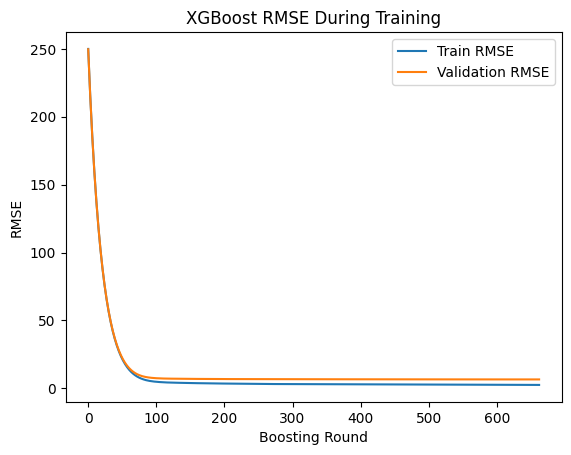

In [29]:
# Plot the rmse for each iteration to evaluate convergence
results = xgb_model.evals_result()

train_rmse = results['validation_0']['rmse']
val_rmse = results['validation_1']['rmse']

plt.plot(train_rmse, label='Train RMSE')
plt.plot(val_rmse, label='Validation RMSE')
plt.xlabel("Boosting Round")
plt.ylabel("RMSE")
plt.legend()
plt.title("XGBoost RMSE During Training")
plt.show()


In [29]:
prediction = xgb_model.predict(x_train)
mean_squared_error(y_train, prediction)

6.522112108920218

In [30]:
cv_prediction = xgb_model.predict(x_cv)
mean_squared_error(y_cv, cv_prediction)

43.106471762444045

In [32]:
# Only run after finished training on cv
test_prediction = xgb_model.predict(x_test)
mean_squared_error(y_test, test_prediction)

205.8995432007482

In [31]:
xgb_model._estimator_type = "regressor"
xgb_model.save_model('wl_xgb_model_basin.json')

In [55]:
# Create full prediction to compare to original data
full_prediction = xgb_model.predict(X)

In [56]:
df_xgb = pd.DataFrame(X, columns=train_cols)
df_xgb['WSE'] = full_prediction

In [58]:
df_check = df_combined.merge(
                        df_xgb,
                        on=['STATION_encoded', 'year', 'month', 'day'],
                        how='left'
                    )

In [ ]:
df_check.columns

Index(['STATION', 'MSMT_DATE', 'WLM_RPE', 'WLM_RPE_QC', 'WLM_GSE',
       'WLM_GSE_QC', 'RPE_WSE', 'RPE_WSE_QC', 'GSE_WSE', 'GSE_WSE_QC', 'WSE_x',
       'WSE_QC', 'ELEV_x', 'LATITUDE_x', 'LONGITUDE_x', 'WELL_DEPTH_x', 'year',
       'month', 'day', 'month_sin_x', 'month_cos_x', 'day_sin_x', 'day_cos_x',
       'days_since_ref_x', 'STATION_encoded', 'days_since_ref_y', 'day_sin_y',
       'day_cos_y', 'month_sin_y', 'month_cos_y', 'ELEV_y', 'LATITUDE_y',
       'LONGITUDE_y', 'WELL_DEPTH_y', 'WSE_y'],
      dtype='object')

In [57]:
df_check.sort_values(by='MSMT_DATE', inplace=True)

NameError: name 'df_check' is not defined

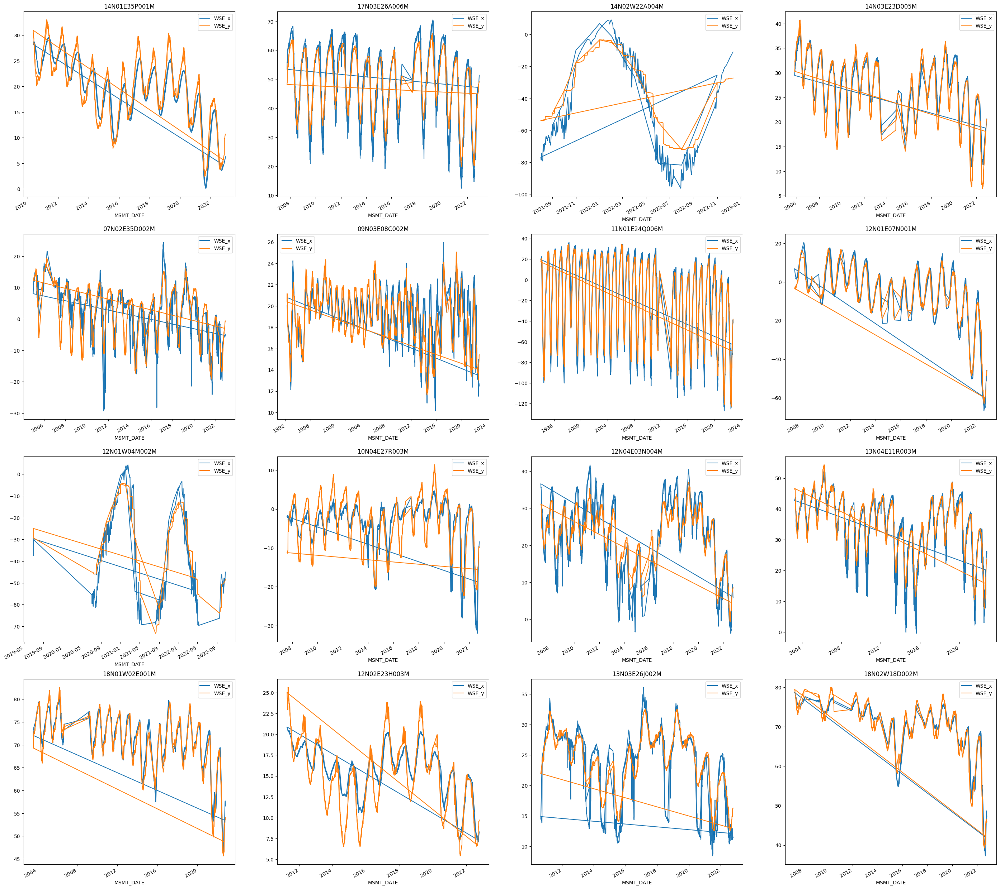

In [59]:
plot_station_data(df_check, cols=['WSE_x','WSE_y'])

#### 4.3 Neural Network

In [53]:
# Split into train array and target array (We will not use day, month, year here since the neural network may not work as well)
train_cols = ['days_since_ref', 'day_sin', 'day_cos', 'month_sin','month_cos','ELEV', 'LATITUDE', 'LONGITUDE', 'WELL_DEPTH']
X = df_combined[train_cols].to_numpy()
y = df_combined['WSE'].to_numpy()

In [54]:
# Split into train, cv, and test datasets
x_train, y_train, x_cv, y_cv, x_test, y_test = utils.split_dataset(X,y)

In [55]:
# Scale for training
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
# x_cv_scaled = scaler.transform(x_cv[:,1:])
# x_test_scaled = scaler.transform(x_test[:,1:])

y_scaler = StandardScaler()
y_train_scaled = y_scaler.fit_transform(y_train.reshape(-1,1))

In [56]:
# Convert to tensorflow format, cannot train on station name for nn, but it will be useful for comparison later so it is kept in x_train
x_train_nn = np.array([x_train_scaled])
y_train_nn = np.array([y_train_scaled])

x_cv_nn = np.array([x_cv])
y_cv_nn = np.array([y_cv])

x_test_nn = np.array([x_test])
y_test_nn = np.array([y_test])

In [64]:
# Specify early stop of the model
early_stop = EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)

lambda_ = 0.01
# Create neural network
nn_model = Sequential(
  [
  Dense(100, activation='relu', kernel_regularizer=regulate.l2(lambda_)),
  Dense(50, activation='relu', kernel_regularizer=regulate.l2(lambda_)),
  Dense(30, activation='relu', kernel_regularizer=regulate.l2(lambda_)),
  Dense(1, activation='linear')
  ], name = 'waterlevel_model'
)

nn_model.compile(
    loss=MeanSquaredError(),
    optimizer=adam_v2.Adam(.01)
)

history = nn_model.fit(
  x_train_nn, y_train_nn,
  epochs=500,        
  verbose=1,
  callbacks=[early_stop]
)

Epoch 1/500
1/1 [==============================] - 2s 2s/step - loss: 2.3277
Epoch 2/500
1/1 [==============================] - 1s 812ms/step - loss: 1.9170
Epoch 3/500
1/1 [==============================] - 1s 769ms/step - loss: 1.6145
Epoch 4/500
1/1 [==============================] - 1s 767ms/step - loss: 1.3300
Epoch 5/500
1/1 [==============================] - 1s 761ms/step - loss: 1.0825
Epoch 6/500
1/1 [==============================] - 1s 731ms/step - loss: 0.9351
Epoch 7/500
1/1 [==============================] - 1s 762ms/step - loss: 0.9201
Epoch 8/500
1/1 [==============================] - 1s 720ms/step - loss: 0.8979
Epoch 9/500
1/1 [==============================] - 1s 747ms/step - loss: 0.8024
Epoch 10/500
1/1 [==============================] - 1s 750ms/step - loss: 0.7021
Epoch 11/500
1/1 [==============================] - 1s 766ms/step - loss: 0.6588
Epoch 12/500
1/1 [==============================] - 1s 742ms/step - loss: 0.6283
Epoch 13/500
1/1 [======================

In [65]:
nn_model.summary()

Model: "waterlevel_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 602353, 100)       1000      
_________________________________________________________________
dense_9 (Dense)              (None, 602353, 50)        5050      
_________________________________________________________________
dense_10 (Dense)             (None, 602353, 30)        1530      
_________________________________________________________________
dense_11 (Dense)             (None, 602353, 1)         31        
Total params: 7,611
Trainable params: 7,611
Non-trainable params: 0
_________________________________________________________________


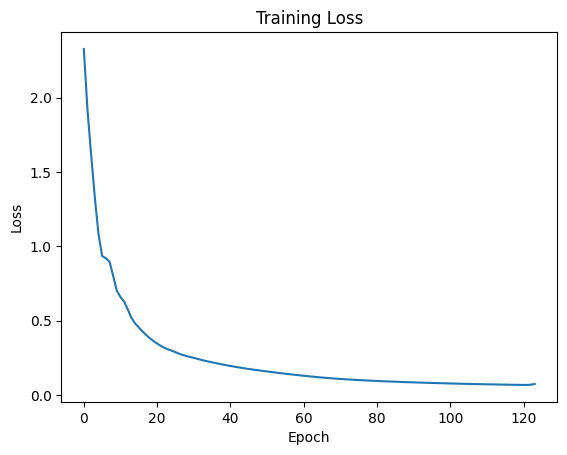

In [66]:
plt.plot(history.history['loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()

In [67]:
y_pred_scaled = nn_model.predict(x_train_nn)
y_pred = y_scaler.inverse_transform(y_pred_scaled[0])
mean_squared_error(y_train, y_pred)

631.4807226620208

In [69]:
y_cv_scaled = nn_model.predict(x_cv_nn)
y_pred_cv = y_scaler.inverse_transform(y_cv_scaled[0])
mean_squared_error(y_cv, y_pred_cv)

70274671579323.87